In [1]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import seaborn as sns
import plotly.express as px
import pandas as pd

In [2]:
import sqlite3
from xmlrpc.client import Boolean
import pandas as pd
class SqliteOperation(object):
    """Generic class for basic SQLite Operations."""
    def __init__(self, path:str, batchsize:int=50):
        self.path = path
        self._connect = sqlite3.connect(path)
        self._cur = self._connect.cursor()
        self._connect.row_factory = sqlite3.Row
        self.batchsize = batchsize
        self.last_cursor = self._cur # Needed to query DB batchwise
        
    def execute_query(self, query:str, values:list=None, commit_=True) -> None:
        try:
            if values == None:
                self._cur.execute(query)
            else:
                self._cur.execute(query, values)
            if commit_:
                self._connect.commit()
                # print("*** Query commited successfully.")
        except sqlite3.Error as e:
            print(f"*** The error '{e}' occurred.")
        return
    
    def commit(self):
        self._connect.commit()
        return
    
    def close_conn(self):
        self._cur.close()
        self._connect.close()
        return
    
    def reopen_cursor(self):
        self.close_conn()
        self._connect = sqlite3.connect(self.path)
        self._cur = self._connect.cursor()
        return
    
    def create_table(self, name:str, schema:list) -> None:
        combined_schema = ", ".join(schema)
        create_table_query = """
        CREATE TABLE IF NOT EXISTS {}({})
        """.format(name, combined_schema)
        self.execute_query(create_table_query)
        return
    
    def convert_schema_to_label(self, schema:list) -> list:
        label_list = []
        for i in schema:
            # Extract only column name & insert to a list
            label_list.append((i.split()[0]))
        return label_list
    
    def insert_table(self, name:str, label:list, values_to_insert:list, commit_=True) -> None:
        total_columns = len(label)
        # Create necessary strings for SQLite query
        combined_label = ", ".join(label)
        string_for_values = ",".join(['?' for i in range(total_columns)])
        insert_table_query = """
        INSERT INTO {} ({})
        VALUES ({})
        """.format(name, combined_label, string_for_values)
        self.execute_query(insert_table_query, values_to_insert, commit_)
        return
    
    def repair_df_format(self, df_to_insert:pd.DataFrame) -> pd.DataFrame:
        label = list(df_to_insert.columns)
        #1 Repair date columns have correct format:
        # Necessary because SQLite doesn't have a datetime datatype
        # The next line looks for any label with date string
        datelabel_index = [i for i, s in enumerate(list(df_to_insert.columns)) if 'date' in s]
        for i in datelabel_index:
            current_label = label[i]
            df_to_insert[current_label] = df_to_insert[current_label].astype('str')
        return df_to_insert
        
    def insert_table_from_df(self, name, df_to_insert:pd.DataFrame) -> None:
        # Wraper for insert_table method for dataframe input.
        count = 0
        commit_ = False
        df_to_insert = self.repair_df_format(df_to_insert)
        label = list(df_to_insert.columns)
        for i in df_to_insert.itertuples(index=False):
            self.insert_table(name, label, list(i), commit_)
            # Divide and conquer commiting:
            count += 1
            if count == 100:
                commit_, count = True, 0
            else:
                commit_ = False
        self._connect.commit()
        # print("*** Query commited successfully.")
        return
    
    def add_new_column(self, table_name:str, new_column_name:str, \
        new_column_format:str) -> None:
        base = "ALTER TABLE {} ADD {} {}"
        return base.format(table_name, new_column_name, new_column_format)
    
    def update_column(self, table_name, column_name, where_column, column_value, \
        where_value):
        #UPDATE preprocessed_datas SET preprocessed_html = NULL WHERE id = 71367783
        base = """UPDATE {} SET {} = "{}" WHERE {} = {}"""
        query = base.format(table_name, column_name, column_value, where_column, \
            where_value)
        self.execute_query(query, commit_=False)
        return
    
    def generate_query_to_read_db(self, name:str, select_attr:str="*", \
        where_attr:str=None, like_attr:str=None, order_attr:str=None, \
        descending:Boolean=True, limit:int=None, offset:int=None) -> str:
        """Generate query to read from SQLite."""
        base = r'SELECT {} FROM {}'
        base = base.format(select_attr, name)
        if where_attr != None:
            where_base = r'WHERE {} LIKE {}'
            where_base = where_base.format(where_attr, like_attr)
            base = " ".join([base, where_base])
        if order_attr != None:
            order_base = r'ORDER BY {} {}'
            if descending:
                direction_str = "DESC"
            else:
                direction_str = "ASC"
            order_base.format(order_attr, direction_str)
            base = " ".join([base, order_base])
        if limit != None:
            limit_str = r'LIMIT {}'.format(str(limit))
            base = " ".join([base, limit_str])
        if offset != None:
            offset_str = r'OFFSET {}'.format(str(offset))
            base = " ".join([base, offset_str])
        return base
    
    def read_from_db(self, name:str, select_attr:str="*", \
        where_attr:str=None, like_attr:str=None, order_attr:str=None, \
        descending:Boolean=True, limit:int=None, offset:int=None) -> sqlite3.Cursor:
        """This function reads table from a DB and returns an itterable.
        It uses "generate_query_to_read_db" to generate the necessary query.
        """
        query_str = self.generate_query_to_read_db(name, select_attr, \
            where_attr, like_attr, order_attr, descending, limit, offset)
        self.execute_query(query_str)
        for result in iter(self._cur.fetchone, None):
            yield result
    
    def get_rowcount_from_db(self, name:str) -> int:
        """Get total row count of a table. Useful when querying using offset."""
        rowcount_itter = self.read_from_db(name, "COUNT(*)")
        rowcount = next(rowcount_itter)[0]
        return rowcount
    
    def generate_query_batchread(self, name:str, select_attr:str="*", \
        where_attr:str=None, like_attr:str=None, order_attr:str=None, \
        descending:Boolean=True, limit:int=None, offset:int=None) -> list:
        """This function will generate a list consisting query string for 
        multiple batch sizes with OFFSET and save it in a list.
        Output: list of query string.
        Goal: querying the DB in a memory friendly way.
        How to use? Use self.execute_query(self.generate_query_batchread(...)).
        It becomes iterator and with for loop, each iteration can be called.
        """
        max_rowcount = self.get_rowcount_from_db(name)
        if offset == None:
            start_rowcount = 0
        else:
            start_rowcount = offset
            
        if limit == None:
            total_requested_rowcount = max_rowcount
        else:
            total_requested_rowcount = limit
        
        # Generate the size for different batches for LIMIT variable
        available_rowcount = total_requested_rowcount - start_rowcount
        fullrange_count = available_rowcount//self.batchsize
        lastrange_count = available_rowcount%self.batchsize
        batchsize_list = []
        for i in range(fullrange_count):
            batchsize_list.append(self.batchsize)
        batchsize_list.append(lastrange_count)

        # Generate the start position for different batches
        start_position_list = []
        temp_position = start_rowcount
        for i in range(fullrange_count+1):
            temp_position = start_rowcount + i*self.batchsize
            start_position_list.append(temp_position)
        
        # Generate query strings with different start_position, batch size and
        # save it in a list.
        batch_query_list = []
        for i in range(fullrange_count+1):
            start_position = start_position_list[i]
            batch_size = batchsize_list[i]
            query_str = self.generate_query_to_read_db(name, select_attr, \
                where_attr, like_attr, order_attr, descending, \
                batch_size, start_position)
            batch_query_list.append(query_str)
        return batch_query_list
        
if __name__ == "__main__":
    PATH_SQLITE = "/Users/gunardiali/Documents/Master_Data_Science/Semester_1/NLP_StackOverflow/Project_StackOverflow/DB/StackOverflow.sqlite"
    NAME_TABLE = "raw_datas"
    
    sqlite_handler = SqliteOperation(PATH_SQLITE, 3)
    itterable_row = sqlite_handler.read_from_db(NAME_TABLE, "id", limit=10)
    
    for i in itterable_row:
        print(i)
    
    # batch_query_list = sqlite_handler.generate_query_batchread(NAME_TABLE, "id", limit=12)
    # batch_count = 0
    # for batch in batch_query_list:
    #     print("{}. itterator:".format(batch_count+1))
    #     print(batch)
    #     batch_count += 1
    #     sqlite_handler.execute_query(batch)
    #     batch_iterator = sqlite_handler.last_cursor
    #     for i in batch_iterator:
    #         print(i)

(71367783,)
(71367669,)
(71367358,)
(71367342,)
(71367079,)
(71367063,)
(71366764,)
(71366719,)
(71366590,)
(71366583,)


In [3]:
PATH_SQLITE = "/Users/gunardiali/Documents/Master_Data_Science/Semester_1/NLP_StackOverflow/Project_StackOverflow/DB/StackOverflow.sqlite"
NAME_TABLE = "raw_datas"

In [4]:
sqlite_handler = SqliteOperation(PATH_SQLITE, 50)

In [5]:
query = """
    SELECT substr(creation_date, 1, 4) AS year, count(*)
    FROM raw_datas
    GROUP BY substr(creation_date, 1, 4)
"""

In [6]:
sqlite_handler.execute_query(query)
annual_post_num = pd.DataFrame(sqlite_handler.last_cursor, columns=["year", "total_posts"])
annual_post_num.set_index("year", inplace=True)
annual_post_num

,total_posts
year,
2008,451
2009,2971
2010,5810
2011,11369
2012,17834
2013,25500
2014,28839
2015,31368
2016,31340


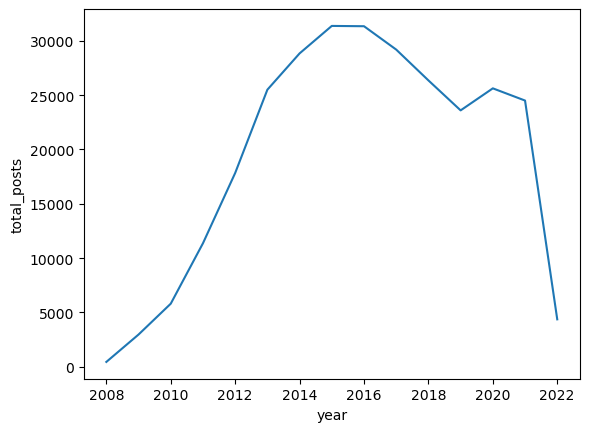

In [7]:
p = sns.lineplot(data=annual_post_num, x='year', y='total_posts')
p.xaxis.set_major_locator(ticker.MultipleLocator(2))

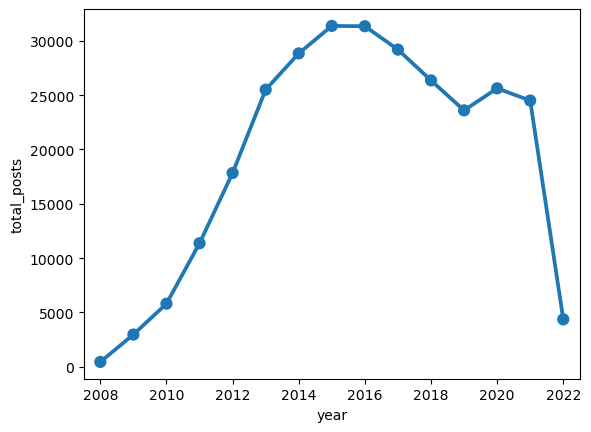

In [8]:
p = sns.pointplot(data=annual_post_num, x=annual_post_num.index, y='total_posts', markers="o")
p.xaxis.set_major_locator(ticker.MultipleLocator(2))

In [9]:
sqlite_handler.execute_query(query)
annual_post_num = pd.DataFrame(sqlite_handler.last_cursor, columns=["year", "total_posts"])
annual_post_num

,year,total_posts
0,2008,451
1,2009,2971
2,2010,5810
3,2011,11369
4,2012,17834
5,2013,25500
6,2014,28839
7,2015,31368
8,2016,31340
9,2017,29190


In [10]:
sns.set(rc={'figure.figsize':(10,5)})

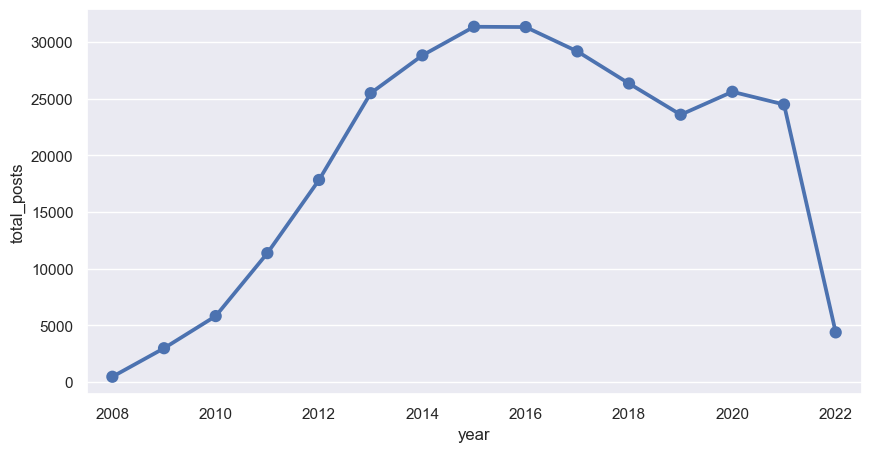

In [11]:
p = sns.pointplot(data=annual_post_num, x='year', y='total_posts', markers="o")
p.xaxis.set_major_locator(ticker.MultipleLocator(2))

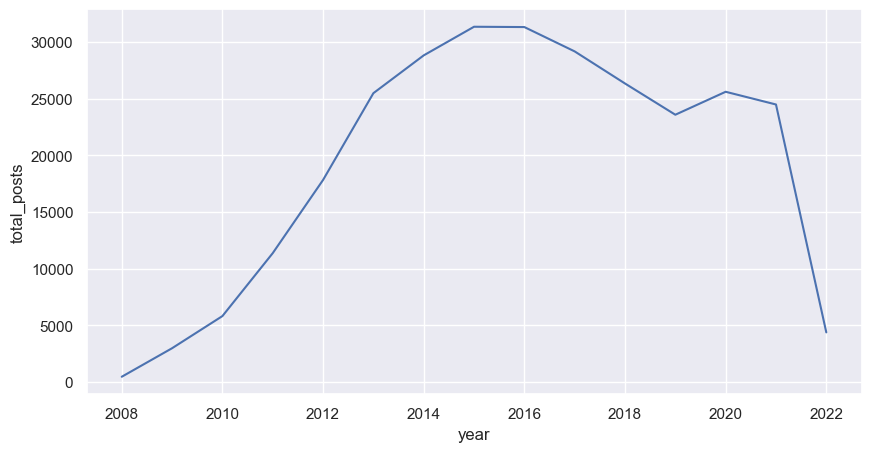

In [12]:
p = sns.lineplot(data=annual_post_num, x='year', y='total_posts', markers=True)
p.xaxis.set_major_locator(ticker.MultipleLocator(2))

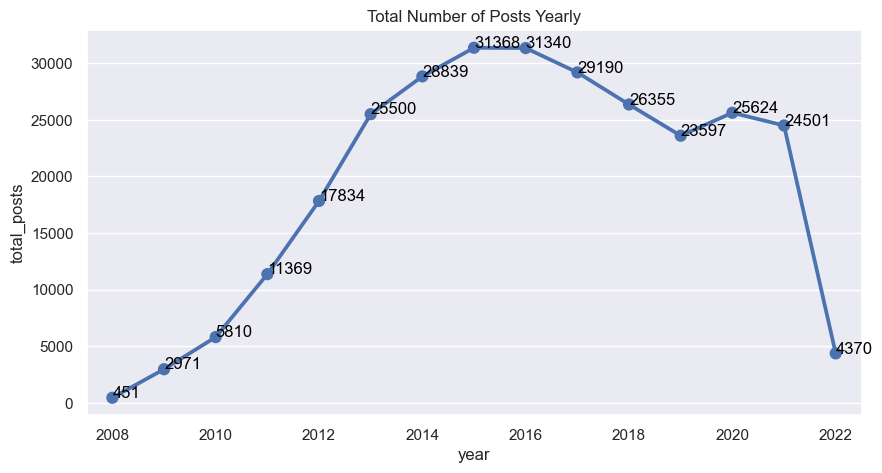

In [13]:
p = sns.pointplot(data=annual_post_num, x='year', y='total_posts', markers="o")
p.xaxis.set_major_locator(ticker.MultipleLocator(2))
p.set(title='Total Number of Posts Yearly')

#p.xaxis.set_major_locator(ticker.MultipleLocator(2))
for x, y in zip(annual_post_num['year'], annual_post_num['total_posts']):
 # the position of the data label relative to the data point can be adjusted by adding/subtracting a value from the x &/ y coordinates
 plt.text(x = int(x)-2008, # x-coordinate position of data label
 y = y, # y-coordinate position of data label, adjusted to be 150 below the data point
 s = '{:.0f}'.format(y), # data label, formatted to ignore decimals
 color = 'black') # set colour of line

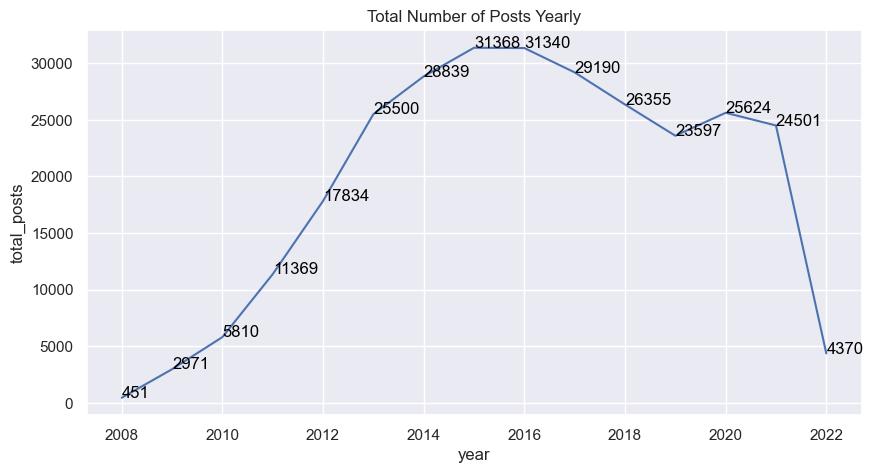

In [14]:
#p = sns.pointplot(data=annual_post_num, x=annual_post_num.index, y='total_posts', markers="o")

p = sns.lineplot(data=annual_post_num, x='year', y='total_posts', markers="o")
p.xaxis.set_major_locator(ticker.MultipleLocator(2))
p.set(title='Total Number of Posts Yearly')

#p.xaxis.set_major_locator(ticker.MultipleLocator(2))
for x, y in zip(annual_post_num['year'], annual_post_num['total_posts']):
 # the position of the data label relative to the data point can be adjusted by adding/subtracting a value from the x &/ y coordinates
 plt.text(x = int(x)-2008, # x-coordinate position of data label
 y = y, # y-coordinate position of data label, adjusted to be 150 below the data point
 s = '{:.0f}'.format(y), # data label, formatted to ignore decimals
 color = 'black') # set colour of line

In [15]:
fig = px.line(annual_post_num, x="year", y="total_posts", text="total_posts", title='Total Number of Posts Yearly',)
fig.update_traces(textposition="bottom right")
fig.update_layout(title_x=0.5, title_y=0.85)
fig.show()

In [16]:
query2 = """
    SELECT substr(creation_date, 1, 4) AS year, count(*)AS total_posts , count(raw_datas.accepted_answer_id) AS finished_posts
    FROM raw_datas
    GROUP BY substr(creation_date, 1, 4)
"""

In [17]:
sqlite_handler.execute_query(query2)
df = pd.DataFrame(sqlite_handler.last_cursor, columns=["year", "total_posts", "finished_posts"])
df

,year,total_posts,finished_posts
0,2008,451,329
1,2009,2971,2074
2,2010,5810,3954
3,2011,11369,7466
4,2012,17834,10790
5,2013,25500,13284
6,2014,28839,13886
7,2015,31368,14028
8,2016,31340,13269
9,2017,29190,11757


In [18]:
df.loc[:,'unfinished_posts'] = df.loc[:,'total_posts'] - df.loc[:,'finished_posts']
df

,year,total_posts,finished_posts,unfinished_posts
0,2008,451,329,122
1,2009,2971,2074,897
2,2010,5810,3954,1856
3,2011,11369,7466,3903
4,2012,17834,10790,7044
5,2013,25500,13284,12216
6,2014,28839,13886,14953
7,2015,31368,14028,17340
8,2016,31340,13269,18071
9,2017,29190,11757,17433


In [19]:
df2 = df.melt(id_vars=['year'], value_vars=['finished_posts', 'unfinished_posts'], ignore_index=False, var_name='type', value_name='total')
df2

,year,type,total
0,2008,finished_posts,329
1,2009,finished_posts,2074
2,2010,finished_posts,3954
3,2011,finished_posts,7466
4,2012,finished_posts,10790
5,2013,finished_posts,13284
6,2014,finished_posts,13886
7,2015,finished_posts,14028
8,2016,finished_posts,13269
9,2017,finished_posts,11757


In [20]:
df2 = df2.sort_values(by="year")
df2.reset_index(inplace = True, drop = True)
df2

,year,type,total
0,2008,finished_posts,329
1,2008,unfinished_posts,122
2,2009,finished_posts,2074
3,2009,unfinished_posts,897
4,2010,finished_posts,3954
5,2010,unfinished_posts,1856
6,2011,finished_posts,7466
7,2011,unfinished_posts,3903
8,2012,finished_posts,10790
9,2012,unfinished_posts,7044


In [21]:
fig = px.histogram(df2, x="year", y="total", color="type")
fig.update_layout(title_text="Total Annual Questions", title_x=0.5, title_y=0.95)
fig.show()

In [22]:
df2.columns

Index(['year', 'type', 'total'], dtype='object')

In [23]:
df2['year'] = pd.to_numeric(df2['year'])

In [24]:
df2.dtypes

year      int64
type     object
total     int64
dtype: object

In [25]:
df3 = df2[df2['year'].between(2012, 2021)]
df3.head()

,year,type,total
8,2012,finished_posts,10790
9,2012,unfinished_posts,7044
10,2013,finished_posts,13284
11,2013,unfinished_posts,12216
12,2014,finished_posts,13886


In [26]:
df3.total.sum()

264148

In [27]:
fig = px.histogram(df3, x="year", y="total", color="type")
fig.update_layout(title_text="Total Annual Questions", title_x=0.5, title_y=0.95)
fig.show()

In [28]:
df

,year,total_posts,finished_posts,unfinished_posts
0,2008,451,329,122
1,2009,2971,2074,897
2,2010,5810,3954,1856
3,2011,11369,7466,3903
4,2012,17834,10790,7044
5,2013,25500,13284,12216
6,2014,28839,13886,14953
7,2015,31368,14028,17340
8,2016,31340,13269,18071
9,2017,29190,11757,17433


In [29]:
df3 = pd.DataFrame()
df3.loc[:,"year"] = df.loc[:,"year"]
df3

,year
0,2008
1,2009
2,2010
3,2011
4,2012
5,2013
6,2014
7,2015
8,2016
9,2017


In [30]:
df3.loc[:,"%_finished_posts"] = (df.loc[:,"finished_posts"]/df.loc[:,"total_posts"] * 100).astype(int)
df3.loc[:,"%_unfinished_posts"] = 100 - df3.loc[:,"%_finished_posts"]
df3

,year,%_finished_posts,%_unfinished_posts
0,2008,72,28
1,2009,69,31
2,2010,68,32
3,2011,65,35
4,2012,60,40
5,2013,52,48
6,2014,48,52
7,2015,44,56
8,2016,42,58
9,2017,40,60


In [31]:
df3 = df3.rename(columns={"%_finished_posts": "finished_posts", "%_unfinished_posts": "unfinished_posts"})
df3

,year,finished_posts,unfinished_posts
0,2008,72,28
1,2009,69,31
2,2010,68,32
3,2011,65,35
4,2012,60,40
5,2013,52,48
6,2014,48,52
7,2015,44,56
8,2016,42,58
9,2017,40,60


In [32]:
df3 = df3.melt(id_vars=['year'], value_vars=['finished_posts', 'unfinished_posts'], ignore_index=False, var_name='type', value_name='total')
df3

,year,type,total
0,2008,finished_posts,72
1,2009,finished_posts,69
2,2010,finished_posts,68
3,2011,finished_posts,65
4,2012,finished_posts,60
5,2013,finished_posts,52
6,2014,finished_posts,48
7,2015,finished_posts,44
8,2016,finished_posts,42
9,2017,finished_posts,40


In [33]:
df3 = df3.sort_values(by="year")
df3.reset_index(inplace = True, drop = True)
df3

,year,type,total
0,2008,finished_posts,72
1,2008,unfinished_posts,28
2,2009,finished_posts,69
3,2009,unfinished_posts,31
4,2010,finished_posts,68
5,2010,unfinished_posts,32
6,2011,finished_posts,65
7,2011,unfinished_posts,35
8,2012,finished_posts,60
9,2012,unfinished_posts,40


In [34]:
fig = px.histogram(df3, x="year", y="total", color="type")
fig.update_layout(title_text="Relative Amount of Questions", title_x=0.5, title_y=0.95, yaxis_title="%")
fig.update_layout(legend_title_text='Type', legend_traceorder="reversed")

newnames = {'unfinished_posts':'Unfinished Posts', 'finished_posts': 'Finished Posts'}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )

fig.show()

In [35]:
query = """
    SELECT raw_datas.id, raw_datas.creation_date, raw_datas.accepted_answer_id, raw_answer_datas.creation_date AS answer_date
    FROM raw_datas
    JOIN raw_answer_datas
    ON raw_datas.accepted_answer_id = raw_answer_datas.id
    WHERE raw_datas.accepted_answer_id NOTNULL AND
        (substr(raw_datas.creation_date, 1, 4) BETWEEN '2012' AND '2021')
"""

In [36]:
sqlite_handler.execute_query(query)
df = pd.DataFrame(sqlite_handler.last_cursor, columns=["post_id", "creation_date", "answer_id", "answer_date"])
#df.set_index("year", inplace=True)
df.head()

,post_id,creation_date,answer_id,answer_date
0,70546175,2021-12-31 23:17:56.710000+00:00,70546238,2021-12-31 23:36:45.273000+00:00
1,70545763,2021-12-31 21:30:08.993000+00:00,70612718,2022-01-06 19:36:52.490000+00:00
2,70545585,2021-12-31 20:48:18.710000+00:00,70561270,2022-01-03 02:50:39.107000+00:00
3,70544622,2021-12-31 17:56:33.023000+00:00,70544712,2021-12-31 18:09:06.527000+00:00
4,70544365,2021-12-31 17:17:41.060000+00:00,70579970,2022-01-04 14:03:11.543000+00:00


In [37]:
df.dtypes

post_id           int64
creation_date    object
answer_id         int64
answer_date      object
dtype: object

In [38]:
df.loc[:,"creation_date"] = pd.to_datetime(df.loc[:,"creation_date"])
df.loc[:,"answer_date"] = pd.to_datetime(df.loc[:,"answer_date"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112606 entries, 0 to 112605
Data columns (total 4 columns):
 #   Column         Non-Null Count   Dtype              
---  ------         --------------   -----              
 0   post_id        112606 non-null  int64              
 1   creation_date  112606 non-null  datetime64[ns, UTC]
 2   answer_id      112606 non-null  int64              
 3   answer_date    112606 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](2), int64(2)
memory usage: 3.4 MB


/var/folders/8k/661zw29d2hvbygdm3fn9_dz40000gn/T/ipykernel_1327/2197055623.py:1: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`

/var/folders/8k/661zw29d2hvbygdm3fn9_dz40000gn/T/ipykernel_1327/2197055623.py:2: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



In [39]:
df['diff_day'] = (df['answer_date'] - df['creation_date']).dt.days

In [40]:
df.head()

,post_id,creation_date,answer_id,answer_date,diff_day
0,70546175,2021-12-31 23:17:56.710000+00:00,70546238,2021-12-31 23:36:45.273000+00:00,0
1,70545763,2021-12-31 21:30:08.993000+00:00,70612718,2022-01-06 19:36:52.490000+00:00,5
2,70545585,2021-12-31 20:48:18.710000+00:00,70561270,2022-01-03 02:50:39.107000+00:00,2
3,70544622,2021-12-31 17:56:33.023000+00:00,70544712,2021-12-31 18:09:06.527000+00:00,0
4,70544365,2021-12-31 17:17:41.060000+00:00,70579970,2022-01-04 14:03:11.543000+00:00,3


In [41]:
df_days = pd.DataFrame(df['diff_day'].value_counts()).rename(columns={"diff_day": "post_num"}).reset_index(names=["days"])
df_days.sort_values(by="days", inplace=True)
df_days.head()

,days,post_num
0,0,79935
1,1,7030
2,2,4207
3,3,2709
4,4,1966


In [42]:
fig = px.line(df_days.iloc[:30], x="days", y="post_num", text="post_num", log_y=True, markers="o")
fig.update_traces(textposition="middle right")
fig.update_layout(title_text="Post Duration in Days", title_x=0.5, title_y=0.95)
fig.show()

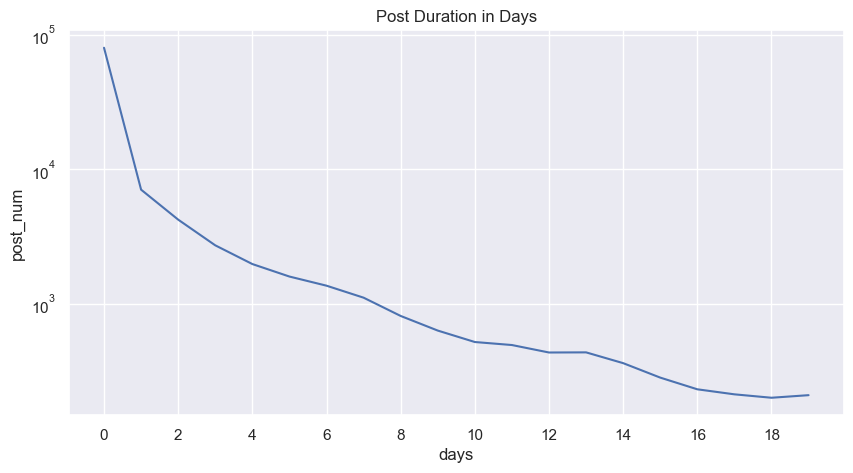

In [43]:
sns.set_style("darkgrid")
fig = sns.lineplot(data=df_days.iloc[:20], x="days", y="post_num", markers="o")
fig.xaxis.set_major_locator(ticker.MultipleLocator(2))
fig.set(title="Post Duration in Days")
fig.set(yscale='log')
plt.show()

In [44]:
df_days['post_num_%'] = (df_days['post_num']/df_days['post_num'].sum(axis=0) * 100).round(2)
df_days.head()

,days,post_num,post_num_%
0,0,79935,70.99
1,1,7030,6.24
2,2,4207,3.74
3,3,2709,2.41
4,4,1966,1.75


In [45]:
fig = px.line(df_days.iloc[:30], x="days", y=df_days.iloc[:30]["post_num_%"], markers="o")
fig.update_layout(title_text="Post Duration in Days", title_x=0.5, title_y=0.95, yaxis_title="%")
fig.update(layout_yaxis_range = [0,8])
fig.show()

In [46]:
df['year'] = df['creation_date'].dt.year
df.head()

,post_id,creation_date,answer_id,answer_date,diff_day,year
0,70546175,2021-12-31 23:17:56.710000+00:00,70546238,2021-12-31 23:36:45.273000+00:00,0,2021
1,70545763,2021-12-31 21:30:08.993000+00:00,70612718,2022-01-06 19:36:52.490000+00:00,5,2021
2,70545585,2021-12-31 20:48:18.710000+00:00,70561270,2022-01-03 02:50:39.107000+00:00,2,2021
3,70544622,2021-12-31 17:56:33.023000+00:00,70544712,2021-12-31 18:09:06.527000+00:00,0,2021
4,70544365,2021-12-31 17:17:41.060000+00:00,70579970,2022-01-04 14:03:11.543000+00:00,3,2021


In [47]:
df_summary = pd.DataFrame(df.value_counts(subset=['year', 'diff_day']), columns=['post_num']).sort_values(by=["year", "diff_day"])
df_summary.head()

post_num
year diff_day          
2012 0             8022
     1              556
     2              297
     3              191
     4              150

In [48]:
total_num = df_summary.groupby(level="year").sum().rename(columns={"post_num":"total"})
total_num.head()

,total
year,
2012,10786
2013,13273
2014,13880
2015,14022
2016,13261


In [49]:
df_summary = df_summary.join(total_num, on="year")
df_summary.head()

post_num  total
year diff_day                 
2012 0             8022  10786
     1              556  10786
     2              297  10786
     3              191  10786
     4              150  10786

In [50]:
df_summary["post_num_%"] = ((df_summary["post_num"]/df_summary["total"])*100)
df_summary.head()

post_num  total  post_num_%
year diff_day                             
2012 0             8022  10786   74.374189
     1              556  10786    5.154830
     2              297  10786    2.753569
     3              191  10786    1.770814
     4              150  10786    1.390692

In [51]:
fig = px.histogram(df_summary.reset_index(), x="year", y="post_num_%", color="diff_day")
fig.show()

In [52]:
df_summary.head()

post_num  total  post_num_%
year diff_day                             
2012 0             8022  10786   74.374189
     1              556  10786    5.154830
     2              297  10786    2.753569
     3              191  10786    1.770814
     4              150  10786    1.390692

In [53]:
df_summary.reset_index(inplace=True)
df_summary.head()

,year,diff_day,post_num,total,post_num_%
0,2012,0,8022,10786,74.374189
1,2012,1,556,10786,5.154830
2,2012,2,297,10786,2.753569
3,2012,3,191,10786,1.770814
4,2012,4,150,10786,1.390692


In [54]:
df_summary["category"] = pd.cut(df_summary["diff_day"], [-0.1, 0.1, 1, 2, 3, 7, 14, 30, 60, 90,180, 365, 10000], 
       labels=["0 day", '1 day', '2 days', "3 days", "1 week", "2 weeks", "1 month", "2 months", "3 months", 
              "6 months", "1 years", ">1 years"])
df_summary.head()

,year,diff_day,post_num,total,post_num_%,category
0,2012,0,8022,10786,74.374189,0 day
1,2012,1,556,10786,5.154830,1 day
2,2012,2,297,10786,2.753569,2 days
3,2012,3,191,10786,1.770814,3 days
4,2012,4,150,10786,1.390692,1 week


In [55]:
fig = px.histogram(df_summary.reset_index(), x="year", y="post_num_%", color="category")
fig.update_layout(legend_title_text='Duration', yaxis_title="Relative Percentage")
fig.update_layout(title_text="Answer Duration", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.show()

In [56]:
df_summary.loc[:,["year", "post_num_%"]].groupby("year").sum()

,post_num_%
year,
2012,100.0
2013,100.0
2014,100.0
2015,100.0
2016,100.0
2017,100.0
2018,100.0
2019,100.0
2020,100.0


In [57]:
query = """
    SELECT raw_datas.id, raw_datas.creation_date, raw_datas.accepted_answer_id, raw_answer_datas.creation_date AS answer_date
    FROM raw_datas
    LEFT JOIN raw_answer_datas
    ON raw_datas.accepted_answer_id = raw_answer_datas.id
    WHERE (substr(raw_datas.creation_date, 1, 4) BETWEEN '2012' AND '2021')
"""

In [58]:
sqlite_handler.execute_query(query)
df_all = pd.DataFrame(sqlite_handler.last_cursor, columns=["post_id", "creation_date", "answer_id", "answer_date"])
#df.set_index("year", inplace=True)
df_all

,post_id,creation_date,answer_id,answer_date
0,70546292,2021-12-31 23:52:03.897000+00:00,NaN,None
1,70546175,2021-12-31 23:17:56.710000+00:00,70546238.0,2021-12-31 23:36:45.273000+00:00
2,70545784,2021-12-31 21:34:39.960000+00:00,NaN,None
3,70545763,2021-12-31 21:30:08.993000+00:00,70612718.0,2022-01-06 19:36:52.490000+00:00
4,70545585,2021-12-31 20:48:18.710000+00:00,70561270.0,2022-01-03 02:50:39.107000+00:00
...,...,...,...,...
264143,8693644,2012-01-01 14:50:45.733000+00:00,8693836.0,2012-01-01 15:31:16.327000+00:00
264144,8693473,2012-01-01 14:09:08.060000+00:00,NaN,None
264145,8692387,2012-01-01 08:25:53.803000+00:00,NaN,None
264146,8691505,2012-01-01 02:08:47.360000+00:00,NaN,None


In [59]:
df_all.dtypes

post_id            int64
creation_date     object
answer_id        float64
answer_date       object
dtype: object

In [60]:
values = {"answer_date": pd.to_datetime("2099-01-01")}
df_all = df_all.fillna(values)
df_all

,post_id,creation_date,answer_id,answer_date
0,70546292,2021-12-31 23:52:03.897000+00:00,NaN,2099-01-01 00:00:00
1,70546175,2021-12-31 23:17:56.710000+00:00,70546238.0,2021-12-31 23:36:45.273000+00:00
2,70545784,2021-12-31 21:34:39.960000+00:00,NaN,2099-01-01 00:00:00
3,70545763,2021-12-31 21:30:08.993000+00:00,70612718.0,2022-01-06 19:36:52.490000+00:00
4,70545585,2021-12-31 20:48:18.710000+00:00,70561270.0,2022-01-03 02:50:39.107000+00:00
...,...,...,...,...
264143,8693644,2012-01-01 14:50:45.733000+00:00,8693836.0,2012-01-01 15:31:16.327000+00:00
264144,8693473,2012-01-01 14:09:08.060000+00:00,NaN,2099-01-01 00:00:00
264145,8692387,2012-01-01 08:25:53.803000+00:00,NaN,2099-01-01 00:00:00
264146,8691505,2012-01-01 02:08:47.360000+00:00,NaN,2099-01-01 00:00:00


In [61]:
df_all.loc[:,"creation_date"] = pd.to_datetime(df_all.loc[:,"creation_date"])
df_all.loc[:,"answer_date"] = pd.to_datetime(df_all.loc[:,"answer_date"])
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264148 entries, 0 to 264147
Data columns (total 4 columns):
 #   Column         Non-Null Count   Dtype              
---  ------         --------------   -----              
 0   post_id        264148 non-null  int64              
 1   creation_date  264148 non-null  datetime64[ns, UTC]
 2   answer_id      112732 non-null  float64            
 3   answer_date    264148 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](2), float64(1), int64(1)
memory usage: 8.1 MB


/var/folders/8k/661zw29d2hvbygdm3fn9_dz40000gn/T/ipykernel_1327/4034287368.py:1: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`

/var/folders/8k/661zw29d2hvbygdm3fn9_dz40000gn/T/ipykernel_1327/4034287368.py:2: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



In [62]:
df_all['diff_day'] = (df_all['answer_date'] - df_all['creation_date']).dt.days
df_all

,post_id,creation_date,answer_id,answer_date,diff_day
0,70546292,2021-12-31 23:52:03.897000+00:00,NaN,2099-01-01 00:00:00+00:00,28124
1,70546175,2021-12-31 23:17:56.710000+00:00,70546238.0,2021-12-31 23:36:45.273000+00:00,0
2,70545784,2021-12-31 21:34:39.960000+00:00,NaN,2099-01-01 00:00:00+00:00,28124
3,70545763,2021-12-31 21:30:08.993000+00:00,70612718.0,2022-01-06 19:36:52.490000+00:00,5
4,70545585,2021-12-31 20:48:18.710000+00:00,70561270.0,2022-01-03 02:50:39.107000+00:00,2
...,...,...,...,...,...
264143,8693644,2012-01-01 14:50:45.733000+00:00,8693836.0,2012-01-01 15:31:16.327000+00:00,0
264144,8693473,2012-01-01 14:09:08.060000+00:00,NaN,2099-01-01 00:00:00+00:00,31776
264145,8692387,2012-01-01 08:25:53.803000+00:00,NaN,2099-01-01 00:00:00+00:00,31776
264146,8691505,2012-01-01 02:08:47.360000+00:00,NaN,2099-01-01 00:00:00+00:00,31776


In [63]:
df_all["year"] = df_all["creation_date"].dt.year
df_all.head()

,post_id,creation_date,answer_id,answer_date,diff_day,year
0,70546292,2021-12-31 23:52:03.897000+00:00,NaN,2099-01-01 00:00:00+00:00,28124,2021
1,70546175,2021-12-31 23:17:56.710000+00:00,70546238.0,2021-12-31 23:36:45.273000+00:00,0,2021
2,70545784,2021-12-31 21:34:39.960000+00:00,NaN,2099-01-01 00:00:00+00:00,28124,2021
3,70545763,2021-12-31 21:30:08.993000+00:00,70612718.0,2022-01-06 19:36:52.490000+00:00,5,2021
4,70545585,2021-12-31 20:48:18.710000+00:00,70561270.0,2022-01-03 02:50:39.107000+00:00,2,2021


In [64]:
df_all_summary = pd.DataFrame(df_all.value_counts(subset=['year', 'diff_day']), columns=['post_num']).sort_values(by=["year", "diff_day"])
df_all_summary.head()

post_num
year diff_day          
2012 0             8022
     1              556
     2              297
     3              191
     4              150

In [65]:
total_all_num = df_all_summary.groupby(level="year").sum().rename(columns={"post_num":"total"})
total_all_num.head()

,total
year,
2012,17834
2013,25500
2014,28839
2015,31368
2016,31340


In [66]:
df_all_summary = df_all_summary.join(total_all_num, on="year")
df_all_summary.head()

post_num  total
year diff_day                 
2012 0             8022  17834
     1              556  17834
     2              297  17834
     3              191  17834
     4              150  17834

In [67]:
df_all_summary["post_num_%"] = ((df_all_summary["post_num"]/df_all_summary["total"])*100)
df_all_summary.head()

post_num  total  post_num_%
year diff_day                             
2012 0             8022  17834   44.981496
     1              556  17834    3.117640
     2              297  17834    1.665358
     3              191  17834    1.070988
     4              150  17834    0.841090

In [68]:
df_all_summary.reset_index(inplace=True)
df_all_summary.head()

,year,diff_day,post_num,total,post_num_%
0,2012,0,8022,17834,44.981496
1,2012,1,556,17834,3.117640
2,2012,2,297,17834,1.665358
3,2012,3,191,17834,1.070988
4,2012,4,150,17834,0.841090


In [69]:
df_all_summary["category"] = pd.cut(df_all_summary["diff_day"], [-0.1, 0.1, 1, 3, 7, 30, 5000, 99999], 
       labels=["<1 day", '1 day', "< 3 days", "< 1 week", "< 1 month", 
              "> 1 month", "No Answer"])
df_all_summary.head()

,year,diff_day,post_num,total,post_num_%,category
0,2012,0,8022,17834,44.981496,<1 day
1,2012,1,556,17834,3.117640,1 day
2,2012,2,297,17834,1.665358,< 3 days
3,2012,3,191,17834,1.070988,< 3 days
4,2012,4,150,17834,0.841090,< 1 week


In [70]:
df_all_summary[df_all_summary["year"]==2012]

,year,diff_day,post_num,total,post_num_%,category
0,2012,0,8022,17834,44.981496,<1 day
1,2012,1,556,17834,3.117640,1 day
2,2012,2,297,17834,1.665358,< 3 days
3,2012,3,191,17834,1.070988,< 3 days
4,2012,4,150,17834,0.841090,< 1 week
...,...,...,...,...,...,...
727,2012,31772,27,17834,0.151396,No Answer
728,2012,31773,21,17834,0.117753,No Answer
729,2012,31774,13,17834,0.072894,No Answer
730,2012,31775,16,17834,0.089716,No Answer


In [71]:
# colors = ['#b2182b','#ef8a62','#fddbc7','#f7f7f7','#d1e5f0','#67a9cf','#2166ac']
# colors = ['#d73027','#fc8d59','#fee090','#ffffbf','#e0f3f8','#91bfdb','#4575b4']
colors = ['#4575b4','#91bfdb','#e0f3f8','#ffffbf','#fee090','#fc8d59','#d73027']

In [72]:
fig = px.histogram(df_all_summary.reset_index(), x="year", y="post_num_%", color="category",
                  color_discrete_sequence=colors)
fig.update_layout(legend_title_text='Duration', yaxis_title="Relative Percentage")
fig.update_layout(title_text="Answer Duration", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.update_layout({'paper_bgcolor': 'rgba(0,0,0,0)',
                  'plot_bgcolor': 'rgba(0,0,0,0)'})
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
fig.update_layout(legend_traceorder="reversed")
fig.show()

In [73]:
df_all_summary["category"] = pd.cut(df_all_summary["diff_day"], [-0.1, 0.1, 3, 30, 5000, 99999], 
       labels=["<1 day", "< 3 days", "< 1 month", 
              ">= 1 month", "No Answer"])
df_all_summary.head()

,year,diff_day,post_num,total,post_num_%,category
0,2012,0,8022,17834,44.981496,<1 day
1,2012,1,556,17834,3.117640,< 3 days
2,2012,2,297,17834,1.665358,< 3 days
3,2012,3,191,17834,1.070988,< 3 days
4,2012,4,150,17834,0.841090,< 1 month


In [74]:
#colors = ['#4575b4','#91bfdb','#e0f3f8','#fee090','#fc8d59','#d73027']
#colors = ['#d73027','#fc8d59','#fee090','#e0f3f8','#91bfdb','#4575b4']
colors = ['#2c7bb6', '#abd9e9', '#fdae61', '#d7191c', '#d9d9d9']

In [75]:
fig = px.histogram(df_all_summary.reset_index(), x="year", y="post_num_%", color="category",
                  color_discrete_sequence=colors)
fig.update_layout(legend_title_text='Duration:', yaxis_title="Relative Distribution (%)",
                 xaxis_title="Year")
#fig.update_layout(title_text="Answer Duration", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.update_layout({'paper_bgcolor': 'rgba(0,0,0,0)',
                  'plot_bgcolor': 'rgba(0,0,0,0)'})
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
#fig.update_layout(legend_traceorder="reversed")
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig.show()

In [76]:
data_path = "/Users/gunardiali/Documents/Master_Data_Science/Semester_1/NLP_StackOverflow/Project_StackOverflow/other/model_2012-2021_1/index/cleaned_df.pickle"

In [77]:
import pickle
def load_from_pickle(file_path):
    with open(file_path, "rb") as r:
        content = pickle.load(r)
    #print("Content from pickle: {}".format(content))
    return content

In [78]:
topic_df = load_from_pickle(data_path)
topic_df.head()

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Datetime
0,14106673,2,0.8414,"docker, run, java, error, spring, file, contai...",Reset File Permissions for Jekyll\nI accidenta...,2012-12-31 23:03:51.223000+00:00
1,14106473,1,0.3375,"class, variable, value, data, function, model,...","PHP SMTP Script ""Failed to Initiate Authentica...",2012-12-31 22:15:46.957000+00:00
2,14106255,1,0.6833,"class, variable, value, data, function, model,...",optimize python processing json retrieved from...,2012-12-31 21:39:28.210000+00:00
3,14106230,3,0.5757,"token, spring, user, login, api, request, secu...",Getting an error implementing Roles in MVC 4\n...,2012-12-31 21:36:08.293000+00:00
4,14106160,1,0.8331,"class, variable, value, data, function, model,...",How can I map a List which contains entities o...,2012-12-31 21:23:01.617000+00:00


In [79]:
topic_df.loc[:, "year"] = topic_df.loc[:, "Datetime"].dt.year
topic_df.head()

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Datetime,year
0,14106673,2,0.8414,"docker, run, java, error, spring, file, contai...",Reset File Permissions for Jekyll\nI accidenta...,2012-12-31 23:03:51.223000+00:00,2012
1,14106473,1,0.3375,"class, variable, value, data, function, model,...","PHP SMTP Script ""Failed to Initiate Authentica...",2012-12-31 22:15:46.957000+00:00,2012
2,14106255,1,0.6833,"class, variable, value, data, function, model,...",optimize python processing json retrieved from...,2012-12-31 21:39:28.210000+00:00,2012
3,14106230,3,0.5757,"token, spring, user, login, api, request, secu...",Getting an error implementing Roles in MVC 4\n...,2012-12-31 21:36:08.293000+00:00,2012
4,14106160,1,0.8331,"class, variable, value, data, function, model,...",How can I map a List which contains entities o...,2012-12-31 21:23:01.617000+00:00,2012


In [80]:
topic_num = pd.DataFrame(topic_df.value_counts(subset=['year', 'Dominant_Topic']), columns=['post_num']).sort_values(by=['year', 'Dominant_Topic'])
topic_num.head(10)

post_num
year Dominant_Topic          
2012 1                   6640
     2                   2361
     3                   2039
     4                   3072
     5                   2036
     6                   1626
2013 1                   8572
     2                   3686
     3                   2814
     4                   3353

In [81]:
total_topic_num = topic_num.groupby(level="year").sum().rename(columns={"post_num":"total"})
total_topic_num.head()

,total
year,
2012,17774
2013,25429
2014,28755
2015,31277
2016,31243


In [82]:
topic_summary = topic_num.join(total_topic_num, on="year")
topic_summary.reset_index(inplace=True)
topic_summary.head(8)

,year,Dominant_Topic,post_num,total
0,2012,1,6640,17774
1,2012,2,2361,17774
2,2012,3,2039,17774
3,2012,4,3072,17774
4,2012,5,2036,17774
5,2012,6,1626,17774
6,2013,1,8572,25429
7,2013,2,3686,25429


In [83]:
topic_summary["post_num_%"] = ((topic_summary["post_num"]/topic_summary["total"])*100)
topic_summary.head(8)

,year,Dominant_Topic,post_num,total,post_num_%
0,2012,1,6640,17774,37.357939
1,2012,2,2361,17774,13.283448
2,2012,3,2039,17774,11.471813
3,2012,4,3072,17774,17.283673
4,2012,5,2036,17774,11.454934
5,2012,6,1626,17774,9.148194
6,2013,1,8572,25429,33.709544
7,2013,2,3686,25429,14.495261


In [84]:
df_all_summary.head()

,year,diff_day,post_num,total,post_num_%,category
0,2012,0,8022,17834,44.981496,<1 day
1,2012,1,556,17834,3.117640,< 3 days
2,2012,2,297,17834,1.665358,< 3 days
3,2012,3,191,17834,1.070988,< 3 days
4,2012,4,150,17834,0.841090,< 1 month


In [85]:
topic_summary.head(15)

,year,Dominant_Topic,post_num,total,post_num_%
0,2012,1,6640,17774,37.357939
1,2012,2,2361,17774,13.283448
2,2012,3,2039,17774,11.471813
3,2012,4,3072,17774,17.283673
4,2012,5,2036,17774,11.454934
5,2012,6,1626,17774,9.148194
6,2013,1,8572,25429,33.709544
7,2013,2,3686,25429,14.495261
8,2013,3,2814,25429,11.066106
9,2013,4,3353,25429,13.185733


In [86]:
topic_dict = {
    1: "General System Dev",
    2: "Android & Java Dev",
    3: "Cloud Access Management",
    4: "Server Architecture",
    5: "Mobile App Dev",
    6: "Website Dev"
}

In [87]:
topic_summary['Dominant Topic'] = topic_summary['Dominant_Topic'].map(topic_dict)
topic_summary.head()

,year,Dominant_Topic,post_num,total,post_num_%,Dominant Topic
0,2012,1,6640,17774,37.357939,General System Dev
1,2012,2,2361,17774,13.283448,Android & Java Dev
2,2012,3,2039,17774,11.471813,Cloud Access Management
3,2012,4,3072,17774,17.283673,Server Architecture
4,2012,5,2036,17774,11.454934,Mobile App Dev


In [88]:
colors = ['#c51b7d', '#e9a3c9', '#fde0ef', '#e6f5d0', '#a1d76a', '#4d9221']

In [89]:
fig = px.histogram(topic_summary, x="year", y="post_num_%", color="Dominant Topic", nbins=10)
fig.update_layout(legend_title_text='Dominant Topic', yaxis_title="Relative Percentage")
fig.update_layout(title_text="Topic Distribution", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.show()

In [90]:
#colors = ['#c51b7d', '#e9a3c9', '#fde0ef', '#e6f5d0', '#a1d76a', '#4d9221']
colors = ['#d73027','#fc8d59','#fee090','#e0f3f8','#91bfdb','#4575b4']

In [91]:
# https://colorbrewer2.org/#type=diverging&scheme=PiYG&n=6
fig = px.histogram(topic_summary, x="year", y="post_num_%", color="Dominant Topic", nbins=10,
                  color_discrete_sequence=colors)
fig.update_layout(legend_title_text='Dominant Topic', yaxis_title="Relative Percentage",
                 xaxis_title="Year")
fig.update_layout(title_text="Topic Distribution", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.update_layout({'paper_bgcolor': 'rgba(0,0,0,0)',
                  'plot_bgcolor': 'rgba(0,0,0,0)'})
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
fig.update_layout(legend_traceorder="reversed")
fig.show()

In [92]:
df3.head()

,year,type,total
0,2008,finished_posts,72
1,2008,unfinished_posts,28
2,2009,finished_posts,69
3,2009,unfinished_posts,31
4,2010,finished_posts,68


In [93]:
new_value = {"finished_posts" : 'yes', "unfinished_posts" : 'no'}
df4=df3.replace({"type": new_value})
df4.head()

,year,type,total
0,2008,yes,72
1,2008,no,28
2,2009,yes,69
3,2009,no,31
4,2010,yes,68


In [94]:
fig = px.histogram(df4, x="year", y="total", color="type", nbins=10,
                  color_discrete_sequence=['#ef8a62','#67a9cf'])
fig.update_layout(legend_title_text='Answered?', yaxis_title="Amount")
fig.update_layout(title_text="Total Annual Questions", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.update_layout({'paper_bgcolor': 'rgba(0,0,0,0)',
                  'plot_bgcolor': 'rgba(0,0,0,0)'})
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
fig.update_layout(legend_traceorder="reversed")
fig.show()

In [95]:
sqlite_handler.execute_query(query2)
df_num = pd.DataFrame(sqlite_handler.last_cursor, columns=["year", "total_posts", "finished_posts"])
df_num.loc[:,'unfinished_posts'] = df_num.loc[:,'total_posts'] - df_num.loc[:,'finished_posts']
df_num.head()

,year,total_posts,finished_posts,unfinished_posts
0,2008,451,329,122
1,2009,2971,2074,897
2,2010,5810,3954,1856
3,2011,11369,7466,3903
4,2012,17834,10790,7044


In [96]:
df_melt_num = df_num.melt(id_vars=['year'], value_vars=['finished_posts', 'unfinished_posts'], ignore_index=False, var_name='type', value_name='total')

df_melt_num = df_melt_num.sort_values(by="year")
df_melt_num.reset_index(inplace = True, drop = True)

df_melt_num.head()

,year,type,total
0,2008,finished_posts,329
1,2008,unfinished_posts,122
2,2009,finished_posts,2074
3,2009,unfinished_posts,897
4,2010,finished_posts,3954


In [97]:
df_num_summary=df_melt_num.replace({"type": new_value})
df_num_summary.head()

,year,type,total
0,2008,yes,329
1,2008,no,122
2,2009,yes,2074
3,2009,no,897
4,2010,yes,3954


In [98]:
df_num_summary.dtypes

year     object
type     object
total     int64
dtype: object

In [99]:
df_num_summary['year'] = pd.to_numeric(df_num_summary['year'])
df_num_summary = df_num_summary[df_num_summary['year'].between(2012, 2021)]
df_num_summary.head()

,year,type,total
8,2012,yes,10790
9,2012,no,7044
10,2013,yes,13284
11,2013,no,12216
12,2014,yes,13886


In [100]:
fig = px.histogram(df_num_summary, x="year", y="total", color="type", nbins=10,
                  color_discrete_sequence=['#1f78b4','#a6cee3'])
#'#fc8d59','#fee090','#e0f3f8','#91bfdb','#4575b4'
fig.update_layout(legend_title_text='Accepted Answer Available?', yaxis_title="Annual Amount of Questions",
                 xaxis_title="Year")
#fig.update_layout(title_text="Total Annual Questions", title_x=0.5, title_y=0.95)
fig.update_layout(bargap=0.2)
fig.update_layout({'paper_bgcolor': 'rgba(0,0,0,0)',
                  'plot_bgcolor': 'rgba(0,0,0,0)'})
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
#fig.update_layout(legend_traceorder="reversed")
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig.show()

In [101]:
df_num_summary.head()

,year,type,total
8,2012,yes,10790
9,2012,no,7044
10,2013,yes,13284
11,2013,no,12216
12,2014,yes,13886


In [102]:
query = """
SELECT raw_datas.id, substr(raw_datas.creation_date, 1, 4) AS creation_year, 
	raw_datas.tags
FROM raw_datas
LEFT JOIN raw_answer_datas
ON raw_datas.accepted_answer_id = raw_answer_datas.id
WHERE (substr(raw_datas.creation_date, 1, 4) BETWEEN '2012' AND '2021')
"""

In [103]:
sqlite_handler.execute_query(query)
df_all = pd.DataFrame(sqlite_handler.last_cursor, columns=["post_id", "creation_date", "tags"])
#df.set_index("year", inplace=True)
df_all.head()

,post_id,creation_date,tags
0,70546292,2021,c#|xamarin.forms|xamarin.forms.maps
1,70546175,2021,java|spring-boot|docker|tomcat|docker-compose
2,70545784,2021,nginx|nginx-config
3,70545763,2021,java|jboss|modeshape|p6spy
4,70545585,2021,javascript|node.js|reactjs|jestjs


In [104]:
df_all.loc[:,'tags'] = np.array([x.strip('[]').split('|') for x in df_all.loc[:,'tags']], dtype=object)

In [105]:
df_all

,post_id,creation_date,tags
0,70546292,2021,"[c#, xamarin.forms, xamarin.forms.maps]"
1,70546175,2021,"[java, spring-boot, docker, tomcat, docker-com..."
2,70545784,2021,"[nginx, nginx-config]"
3,70545763,2021,"[java, jboss, modeshape, p6spy]"
4,70545585,2021,"[javascript, node.js, reactjs, jestjs]"
...,...,...,...
264143,8693644,2012,[grails]
264144,8693473,2012,"[java, tomcat]"
264145,8692387,2012,"[gwt, variables, object]"
264146,8691505,2012,"[java, android, blackberry]"


In [106]:
a = df_all.loc[0,'tags']

In [107]:
type(a), len(a), a

(list, 3, ['c#', 'xamarin.forms', 'xamarin.forms.maps'])

In [108]:
from collections import defaultdict
#a = defaultdict(lambda: "default", key="some_value")
#a[0]

In [109]:
label_dict = defaultdict(lambda: 0)
for list_i in df_all.loc[:,'tags']:
    for i in list_i:
        label_dict[i] += 1

In [110]:
# weighted average
label_dict = defaultdict(lambda: 0)
for list_i in df_all.loc[:,'tags']:
    len_i = len(list_i)
    for i in list_i:
        label_dict[i] += 1/len_i

In [111]:
label_pd = pd.DataFrame(label_dict.items(), columns=['label', 'total']).set_index('label')
label_pd.sort_values(by=['total'], ascending=False, inplace=True)

In [112]:
len(label_pd)

24150

In [113]:
#label_pd.index.tolist()

In [114]:
df_all.loc[0,['creation_date', 'tags']].tolist()

['2021', ['c#', 'xamarin.forms', 'xamarin.forms.maps']]

In [115]:
label_df = pd.DataFrame(0, index=label_pd.index.tolist(), columns=np.arange(2012, 2022))
label_df.index.rename('label')

Index(['android', 'java', 'c#', 'php', 'spring', 'spring-security',
       'spring-boot', 'asp.net', 'javascript', 'python',
       ...
       'jpedal', 'openviewerfx', 'autocloseable', 'try-with-resources', 'intl',
       'menu-items', 'haversine', 'stackage', 'karma-mocha', 'docblox'],
      dtype='object', name='label', length=24150)

In [116]:
label_pd

,total
label,
android,15820.183333
java,15643.350000
c#,7545.316667
php,7404.966667
spring,5493.516667
...,...
menu-items,0.200000
haversine,0.200000
stackage,0.200000


In [117]:
label_df = label_df.join(label_pd)
label_df

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,total
android,0,0,0,0,0,0,0,0,0,0,15820.183333
java,0,0,0,0,0,0,0,0,0,0,15643.350000
c#,0,0,0,0,0,0,0,0,0,0,7545.316667
php,0,0,0,0,0,0,0,0,0,0,7404.966667
spring,0,0,0,0,0,0,0,0,0,0,5493.516667
...,...,...,...,...,...,...,...,...,...,...,...
menu-items,0,0,0,0,0,0,0,0,0,0,0.200000
haversine,0,0,0,0,0,0,0,0,0,0,0.200000
stackage,0,0,0,0,0,0,0,0,0,0,0.200000
karma-mocha,0,0,0,0,0,0,0,0,0,0,0.200000


In [118]:
#a = df_all.loc[0,'tags']
df_all.head()

,post_id,creation_date,tags
0,70546292,2021,"[c#, xamarin.forms, xamarin.forms.maps]"
1,70546175,2021,"[java, spring-boot, docker, tomcat, docker-com..."
2,70545784,2021,"[nginx, nginx-config]"
3,70545763,2021,"[java, jboss, modeshape, p6spy]"
4,70545585,2021,"[javascript, node.js, reactjs, jestjs]"


In [119]:
df_all = df_all.astype({'creation_date': 'int32'})

In [120]:
df_all.dtypes

post_id           int64
creation_date     int32
tags             object
dtype: object

In [121]:
#for i in range(len(df_all)):
#    year = df_all.loc[i, "creation_date"]
#    tags = df_all.loc[i, "tags"]
#    for tag in tags:
#        label_df.loc[tag, year] += 1
#label_df

In [122]:
df_all.head()

,post_id,creation_date,tags
0,70546292,2021,"[c#, xamarin.forms, xamarin.forms.maps]"
1,70546175,2021,"[java, spring-boot, docker, tomcat, docker-com..."
2,70545784,2021,"[nginx, nginx-config]"
3,70545763,2021,"[java, jboss, modeshape, p6spy]"
4,70545585,2021,"[javascript, node.js, reactjs, jestjs]"


In [123]:
# Weighted Average
for i in range(len(df_all)):
    year = df_all.loc[i, "creation_date"]
    tags = df_all.loc[i, "tags"]
    len_tags = len(tags)
    for tag in tags:
        label_df.loc[tag, year] += 1/len_tags
label_df

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,total
android,960.950000,2126.016667,2393.266667,2451.533333,2343.583333,1842.683333,1391.500000,994.800000,749.950000,565.900000,15820.183333
java,830.850000,1425.900000,1925.566667,2078.850000,1993.716667,1856.016667,1592.050000,1392.783333,1372.250000,1175.366667,15643.350000
c#,711.666667,853.066667,965.666667,910.800000,897.633333,797.216667,681.616667,637.266667,576.433333,513.950000,7545.316667
php,637.783333,851.066667,989.333333,1030.866667,991.683333,819.966667,652.783333,517.466667,481.466667,432.550000,7404.966667
spring,268.383333,417.350000,634.350000,730.550000,760.566667,704.283333,618.400000,467.266667,493.283333,399.083333,5493.516667
...,...,...,...,...,...,...,...,...,...,...,...
menu-items,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000
haversine,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000
stackage,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000
karma-mocha,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000


In [124]:
label_df.loc['spring-boot',:]

2012        0.000000
2013        3.416667
2014       98.150000
2015      220.400000
2016      355.333333
2017      476.666667
2018      701.000000
2019      681.633333
2020      731.500000
2021      638.833333
total    3906.933333
Name: spring-boot, dtype: float64

In [125]:
set(label_df.loc[:,list(range(2012, 2022))].sum(axis=1) == label_df.loc[:, 'total'])

{False, True}

In [126]:
label_df.loc[:,list(range(2012, 2022))].sum(axis=1), label_df.loc[:, 'total']

(android        15820.183333
 java           15643.350000
 c#              7545.316667
 php             7404.966667
 spring          5493.516667
                    ...     
 menu-items         0.200000
 haversine          0.200000
 stackage           0.200000
 karma-mocha        0.200000
 docblox            0.200000
 Length: 24150, dtype: float64,
 android        15820.183333
 java           15643.350000
 c#              7545.316667
 php             7404.966667
 spring          5493.516667
                    ...     
 menu-items         0.200000
 haversine          0.200000
 stackage           0.200000
 karma-mocha        0.200000
 docblox            0.200000
 Name: total, Length: 24150, dtype: float64)

In [127]:
label_df.index.tolist()[:30]

['android',
 'java',
 'c#',
 'php',
 'spring',
 'spring-security',
 'spring-boot',
 'asp.net',
 'javascript',
 'python',
 'symfony',
 'mysql',
 'security',
 'spring-mvc',
 'laravel',
 'ruby-on-rails',
 'ssl',
 'c++',
 'wcf',
 'amazon-web-services',
 'asp.net-mvc',
 'node.js',
 'maven',
 'docker',
 'authentication',
 '.net',
 'json',
 'django',
 'hibernate',
 'azure']

In [128]:
label_df.columns.tolist()

[2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 'total']

In [129]:
# Top 30
label_ranking = {}
#for i in label_df.columns.tolist():
for i in range(2012, 2022):
    # label_pd.sort_values(by=['total'], ascending=False, inplace=True)
    temp_df = label_df.sort_values(by=[i], ascending=False)
    label_ranking[i] = temp_df.index.tolist()[:100]

In [130]:
label_ranking_df = pd.DataFrame.from_dict(label_ranking)
label_ranking_df.head()

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,android,android,android,android,android,java,java,java,java,java
1,java,java,java,java,java,android,android,android,android,spring-boot
2,c#,c#,php,php,php,php,spring-boot,spring-boot,spring-boot,android
3,php,php,c#,c#,c#,c#,c#,c#,c#,c#
4,asp.net,asp.net,spring,spring,spring,spring,php,php,spring,php


In [131]:
#xw.view(label_ranking_df)

In [132]:
import xlwings as xw
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FixedFormatter, FixedLocator

In [133]:
#xw.view(label_ranking_df)

In [134]:
data_source = (
    "https://gist.githubusercontent.com/"
    "notionparallax/7ada7b733216001962dbaa789e246a67/raw/"
    "6d306b5d928b04a5a2395469694acdd8af3cbafb/example.csv"
)

df = (
    pd.read_csv(data_source, index_col=0)
    .assign(ed_name=lambda x: x["ed_name"].str.extract(r"(\d+)").astype(int))
    .value_counts(["ed_name", "source"])
    .groupby("ed_name")
    .rank("first", ascending=False)
    .rename("rank")
    .sort_index()
    .reset_index()
    .query("ed_name < 17")
)
df.head()

,ed_name,source,rank
0,1,groene.nl,2.0
1,1,lithub,7.0
2,1,newyorker,1.0
3,1,thecut,6.0
4,1,theguardian,5.0


In [135]:
#xw.view(df)

In [136]:
n_top_ranked = 10
top_sources = df[df["ed_name"] == df["ed_name"].max()].nsmallest(n_top_ranked, "rank")

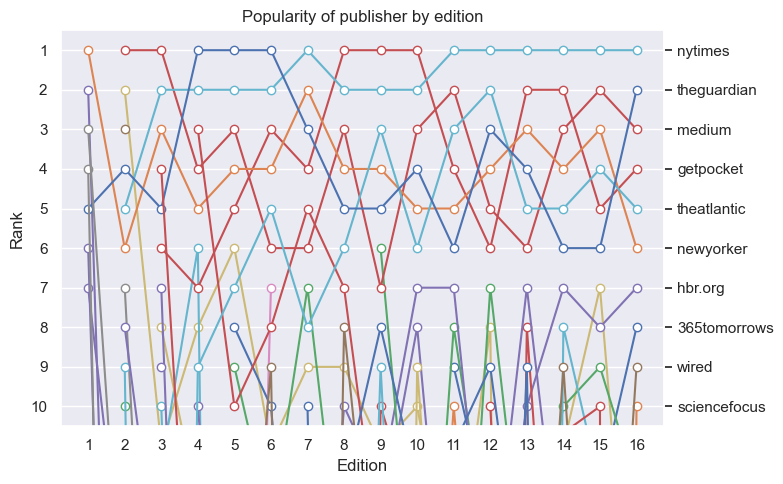

In [137]:
n_top_ranked = 10
fig, ax = plt.subplots(figsize=(8, 5), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_sources["rank"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_sources["source"].to_list()))

for i, j in df.groupby("source"):
    ax.plot("ed_name", "rank", "o-", data=j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Edition", ylabel="Rank", title="Popularity of publisher by edition")
ax.grid(axis="x")
plt.tight_layout()

In [138]:
ranking_data = label_ranking_df.T
ranking_data

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
2012,android,java,c#,php,asp.net,wcf,spring-security,spring,security,symfony,...,forms-authentication,actionscript-3,wcf-security,.htaccess,heroku,applet,validation,forms,android-activity,wcf-binding
2013,android,java,c#,php,asp.net,spring,spring-security,wcf,security,ruby-on-rails,...,zend-framework,cookies,asp.net-mvc-3,vb.net,amazon-ec2,nginx,gwt,sqlite,tomcat7,class
2014,android,java,php,c#,spring,spring-security,asp.net,symfony,spring-mvc,mysql,...,jenkins,soap,class,.htaccess,winforms,azure,android-actionbar,encryption,windows,heroku
2015,android,java,php,c#,spring,spring-security,asp.net,spring-mvc,symfony,javascript,...,nullpointerexception,soap,login,devise,swing,sqlite,inheritance,codeigniter,email,android-actionbar
2016,android,java,php,c#,spring,spring-security,asp.net,spring-boot,symfony,spring-mvc,...,oauth,sqlite,gradle,winforms,soap,inheritance,sql,postgresql,jpa,wildfly
2017,java,android,php,c#,spring,spring-boot,spring-security,symfony,asp.net,javascript,...,encryption,gradle,wildfly,express,flask,database,git,jsp,acumatica,firebase-authentication
2018,java,android,spring-boot,c#,php,spring,spring-security,python,javascript,laravel,...,google-app-engine,xamarin.android,iis,android-fragments,wpf,asp.net-core-2.0,identityserver4,spring-data-jpa,codeigniter,database
2019,java,android,spring-boot,c#,php,spring,spring-security,python,laravel,javascript,...,selenium,cors,jenkins-pipeline,google-app-engine,vue.js,google-cloud-firestore,database,windows,asp.net-web-api,servlets
2020,java,android,spring-boot,c#,spring,php,spring-security,python,laravel,javascript,...,javafx,cookies,selenium,identityserver4,keras,c,google-app-engine,wpf,intellij-idea,azure-ad-b2c
2021,java,spring-boot,android,c#,php,spring,python,spring-security,laravel,javascript,...,ssl-certificate,xml,azure-devops,cors,c,gitlab,terraform-provider-aws,ansible,http,aws-lambda


In [139]:
ranking_data.apply(lambda row: row[row == 'amazon-web-services'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013      Int64Index([], dtype='int64')
2014    Int64Index([82], dtype='int64')
2015    Int64Index([43], dtype='int64')
2016    Int64Index([31], dtype='int64')
2017    Int64Index([16], dtype='int64')
2018    Int64Index([14], dtype='int64')
2019    Int64Index([12], dtype='int64')
2020    Int64Index([12], dtype='int64')
2021    Int64Index([12], dtype='int64')
dtype: object

In [140]:
ranking_data.apply(lambda row: row[row == 'docker'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013      Int64Index([], dtype='int64')
2014      Int64Index([], dtype='int64')
2015    Int64Index([85], dtype='int64')
2016    Int64Index([36], dtype='int64')
2017    Int64Index([22], dtype='int64')
2018    Int64Index([10], dtype='int64')
2019    Int64Index([10], dtype='int64')
2020    Int64Index([10], dtype='int64')
2021    Int64Index([10], dtype='int64')
dtype: object

In [141]:
ranking_data.apply(lambda row: row[row == 'python'].index, axis=1)

2012    Int64Index([27], dtype='int64')
2013    Int64Index([29], dtype='int64')
2014    Int64Index([29], dtype='int64')
2015    Int64Index([15], dtype='int64')
2016    Int64Index([12], dtype='int64')
2017    Int64Index([10], dtype='int64')
2018     Int64Index([7], dtype='int64')
2019     Int64Index([7], dtype='int64')
2020     Int64Index([7], dtype='int64')
2021     Int64Index([6], dtype='int64')
dtype: object

In [142]:
ranking_data.apply(lambda row: row[row == 'laravel'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013      Int64Index([], dtype='int64')
2014    Int64Index([49], dtype='int64')
2015    Int64Index([35], dtype='int64')
2016    Int64Index([21], dtype='int64')
2017    Int64Index([14], dtype='int64')
2018     Int64Index([9], dtype='int64')
2019     Int64Index([8], dtype='int64')
2020     Int64Index([8], dtype='int64')
2021     Int64Index([8], dtype='int64')
dtype: object

In [143]:
ranking_data.apply(lambda row: row[row == 'spring-boot'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013      Int64Index([], dtype='int64')
2014    Int64Index([39], dtype='int64')
2015    Int64Index([13], dtype='int64')
2016     Int64Index([7], dtype='int64')
2017     Int64Index([5], dtype='int64')
2018     Int64Index([2], dtype='int64')
2019     Int64Index([2], dtype='int64')
2020     Int64Index([2], dtype='int64')
2021     Int64Index([1], dtype='int64')
dtype: object

In [144]:
ranking_data.apply(lambda row: row[row == 'kubernetes'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013      Int64Index([], dtype='int64')
2014      Int64Index([], dtype='int64')
2015      Int64Index([], dtype='int64')
2016      Int64Index([], dtype='int64')
2017    Int64Index([66], dtype='int64')
2018    Int64Index([22], dtype='int64')
2019    Int64Index([11], dtype='int64')
2020    Int64Index([11], dtype='int64')
2021    Int64Index([13], dtype='int64')
dtype: object

In [145]:
ranking_data.apply(lambda row: row[row == 'spring-security'].index, axis=1)

2012    Int64Index([6], dtype='int64')
2013    Int64Index([6], dtype='int64')
2014    Int64Index([5], dtype='int64')
2015    Int64Index([5], dtype='int64')
2016    Int64Index([5], dtype='int64')
2017    Int64Index([6], dtype='int64')
2018    Int64Index([6], dtype='int64')
2019    Int64Index([6], dtype='int64')
2020    Int64Index([6], dtype='int64')
2021    Int64Index([7], dtype='int64')
dtype: object

In [146]:
ranking_data.apply(lambda row: row[row == 'ios'].index, axis=1)

2012    Int64Index([72], dtype='int64')
2013    Int64Index([76], dtype='int64')
2014    Int64Index([61], dtype='int64')
2015    Int64Index([40], dtype='int64')
2016    Int64Index([40], dtype='int64')
2017    Int64Index([43], dtype='int64')
2018    Int64Index([66], dtype='int64')
2019    Int64Index([65], dtype='int64')
2020    Int64Index([69], dtype='int64')
2021    Int64Index([72], dtype='int64')
dtype: object

In [147]:
ranking_data.apply(lambda row: row[row == 'azure'].index, axis=1)

2012    Int64Index([71], dtype='int64')
2013    Int64Index([70], dtype='int64')
2014    Int64Index([95], dtype='int64')
2015    Int64Index([65], dtype='int64')
2016    Int64Index([48], dtype='int64')
2017    Int64Index([29], dtype='int64')
2018    Int64Index([26], dtype='int64')
2019    Int64Index([21], dtype='int64')
2020    Int64Index([17], dtype='int64')
2021    Int64Index([18], dtype='int64')
dtype: object

In [148]:
ranking_data.apply(lambda row: row[row == 'django'].index, axis=1)

2012    Int64Index([63], dtype='int64')
2013    Int64Index([51], dtype='int64')
2014    Int64Index([88], dtype='int64')
2015    Int64Index([51], dtype='int64')
2016    Int64Index([35], dtype='int64')
2017    Int64Index([28], dtype='int64')
2018    Int64Index([27], dtype='int64')
2019    Int64Index([22], dtype='int64')
2020    Int64Index([19], dtype='int64')
2021    Int64Index([14], dtype='int64')
dtype: object

In [149]:
ranking_data.apply(lambda row: row[row == 'reactjs'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013      Int64Index([], dtype='int64')
2014      Int64Index([], dtype='int64')
2015      Int64Index([], dtype='int64')
2016      Int64Index([], dtype='int64')
2017      Int64Index([], dtype='int64')
2018    Int64Index([46], dtype='int64')
2019    Int64Index([28], dtype='int64')
2020    Int64Index([20], dtype='int64')
2021    Int64Index([15], dtype='int64')
dtype: object

In [150]:
ranking_data.apply(lambda row: row[row == 'node.js'].index, axis=1)

2012      Int64Index([], dtype='int64')
2013    Int64Index([89], dtype='int64')
2014    Int64Index([67], dtype='int64')
2015    Int64Index([52], dtype='int64')
2016    Int64Index([30], dtype='int64')
2017    Int64Index([18], dtype='int64')
2018    Int64Index([17], dtype='int64')
2019    Int64Index([14], dtype='int64')
2020    Int64Index([13], dtype='int64')
2021    Int64Index([11], dtype='int64')
dtype: object

In [151]:
ranking_data.index.name='year'

In [152]:
ranking_data.reset_index(inplace=True)

In [153]:
ranking_data

,year,0,1,2,3,4,5,6,7,8,...,90,91,92,93,94,95,96,97,98,99
0,2012,android,java,c#,php,asp.net,wcf,spring-security,spring,security,...,forms-authentication,actionscript-3,wcf-security,.htaccess,heroku,applet,validation,forms,android-activity,wcf-binding
1,2013,android,java,c#,php,asp.net,spring,spring-security,wcf,security,...,zend-framework,cookies,asp.net-mvc-3,vb.net,amazon-ec2,nginx,gwt,sqlite,tomcat7,class
2,2014,android,java,php,c#,spring,spring-security,asp.net,symfony,spring-mvc,...,jenkins,soap,class,.htaccess,winforms,azure,android-actionbar,encryption,windows,heroku
3,2015,android,java,php,c#,spring,spring-security,asp.net,spring-mvc,symfony,...,nullpointerexception,soap,login,devise,swing,sqlite,inheritance,codeigniter,email,android-actionbar
4,2016,android,java,php,c#,spring,spring-security,asp.net,spring-boot,symfony,...,oauth,sqlite,gradle,winforms,soap,inheritance,sql,postgresql,jpa,wildfly
5,2017,java,android,php,c#,spring,spring-boot,spring-security,symfony,asp.net,...,encryption,gradle,wildfly,express,flask,database,git,jsp,acumatica,firebase-authentication
6,2018,java,android,spring-boot,c#,php,spring,spring-security,python,javascript,...,google-app-engine,xamarin.android,iis,android-fragments,wpf,asp.net-core-2.0,identityserver4,spring-data-jpa,codeigniter,database
7,2019,java,android,spring-boot,c#,php,spring,spring-security,python,laravel,...,selenium,cors,jenkins-pipeline,google-app-engine,vue.js,google-cloud-firestore,database,windows,asp.net-web-api,servlets
8,2020,java,android,spring-boot,c#,spring,php,spring-security,python,laravel,...,javafx,cookies,selenium,identityserver4,keras,c,google-app-engine,wpf,intellij-idea,azure-ad-b2c
9,2021,java,spring-boot,android,c#,php,spring,python,spring-security,laravel,...,ssl-certificate,xml,azure-devops,cors,c,gitlab,terraform-provider-aws,ansible,http,aws-lambda


In [154]:
ranking_pd = pd.melt(ranking_data, id_vars=['year'], value_vars=list(range(0,100)), var_name='ranking',
                    value_name='label')
ranking_pd.head()

,year,ranking,label
0,2012,0,android
1,2013,0,android
2,2014,0,android
3,2015,0,android
4,2016,0,android


In [155]:
ranking_pd.loc[:,['ranking']]+=1

In [156]:
ranking_pd.head()

,year,ranking,label
0,2012,1,android
1,2013,1,android
2,2014,1,android
3,2015,1,android
4,2016,1,android


In [157]:
list(set(ranking_pd["ranking"]))[:10]

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [158]:
ranking_pd.loc[ranking_pd.year==2021]

,year,ranking,label
9,2021,1,java
19,2021,2,spring-boot
29,2021,3,android
39,2021,4,c#
49,2021,5,php
...,...,...,...
959,2021,96,gitlab
969,2021,97,terraform-provider-aws
979,2021,98,ansible
989,2021,99,http


In [159]:
ranking_pd.loc[ranking_pd.year==2021, 'label'].tolist()[:10]

['java',
 'spring-boot',
 'android',
 'c#',
 'php',
 'spring',
 'python',
 'spring-security',
 'laravel',
 'javascript']

In [160]:
list(set(ranking_pd["ranking"]))[:10][::-1]

[10, 9, 8, 7, 6, 5, 4, 3, 2, 1]

In [161]:
df

,ed_name,source,rank
0,1,groene.nl,2.0
1,1,lithub,7.0
2,1,newyorker,1.0
3,1,thecut,6.0
4,1,theguardian,5.0
...,...,...,...
5135,16,wunderground,260.0
5136,16,www-psychologytoday-com.cdn.ampproject.org,261.0
5137,16,yogalondon.net,262.0
5138,16,zander.substack,263.0


In [162]:
ranking_pd

,year,ranking,label
0,2012,1,android
1,2013,1,android
2,2014,1,android
3,2015,1,android
4,2016,1,android
...,...,...,...
995,2017,100,firebase-authentication
996,2018,100,database
997,2019,100,servlets
998,2020,100,azure-ad-b2c


In [163]:
ranking_pd = ranking_pd.astype({'ranking':'int32', 'year':'int32'})

In [198]:
####

In [187]:
n_top_ranked = 20
top_labels = ranking_pd[ranking_pd["year"] == ranking_pd["year"].min()].nsmallest(n_top_ranked, "ranking")
top_labels.head(20)

,year,ranking,label
0,2012,1,android
10,2012,2,java
20,2012,3,c#
30,2012,4,php
40,2012,5,asp.net
50,2012,6,wcf
60,2012,7,spring-security
70,2012,8,spring
80,2012,9,security
90,2012,10,symfony


In [197]:
ranking_pd.loc[ranking_pd['label'].isin(['wcf'])]

,year,ranking,label
50,2012,6,wcf
71,2013,8,wcf
132,2014,14,wcf
183,2015,19,wcf
284,2016,29,wcf
415,2017,42,wcf
496,2018,50,wcf
547,2019,55,wcf
888,2020,89,wcf


In [201]:
ranking_pd.loc[ranking_pd['label'].isin(['.net'])]

,year,ranking,label
100,2012,11,.net
161,2013,17,.net
222,2014,23,.net
333,2015,34,.net
334,2016,34,.net
346,2018,35,.net
355,2017,36,.net
407,2019,41,.net
419,2021,42,.net
468,2020,47,.net


In [200]:
ranking_pd.loc[ranking_pd['label'].isin(['asp.net', 'asp.net-mvc', 'asp.net-mvc-3'])]

,year,ranking,label
40,2012,5,asp.net
41,2013,5,asp.net
62,2014,7,asp.net
63,2015,7,asp.net
64,2016,7,asp.net
85,2017,9,asp.net
116,2018,12,asp.net
142,2014,15,asp.net-mvc
143,2015,15,asp.net-mvc
150,2012,16,asp.net-mvc


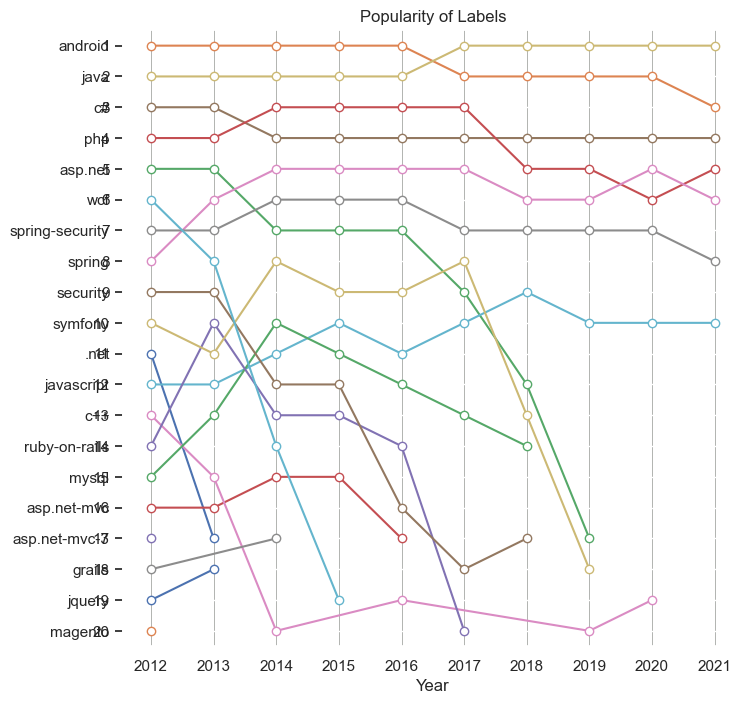

In [193]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("left")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))

top_labels_2012 = top_labels["label"].to_list()
ranking_pd_modified = ranking_pd.loc[ranking_pd['label'].isin(top_labels_2012)]
ranking_pd_modified = ranking_pd_modified[ranking_pd_modified['ranking'].between(1, 20)]

for i, j in ranking_pd_modified.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", title="Popularity of Labels")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

#filename = '/Users/gunardiali/Downloads/ranking_{}.png'.format(n_top_ranked)
#plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
#plt.tight_layout()

plt.show()

In [199]:
###

In [178]:
n_top_ranked = 20
top_labels = ranking_pd[ranking_pd["year"] == ranking_pd["year"].max()].nsmallest(n_top_ranked, "ranking")
top_labels.head()

,year,ranking,label
9,2021,1,java
19,2021,2,spring-boot
29,2021,3,android
39,2021,4,c#
49,2021,5,php


In [165]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

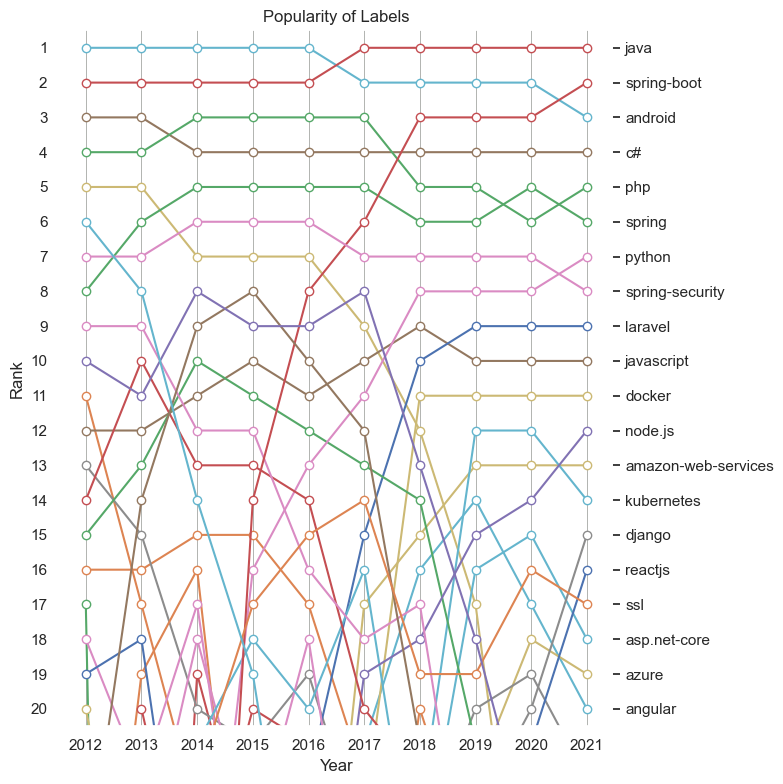

In [182]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))

for i, j in ranking_pd.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", ylabel="Rank", title="Popularity of Labels")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

#filename = '/Users/gunardiali/Downloads/ranking_{}.png'.format(n_top_ranked)
#plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
plt.tight_layout()

#plt.show()

In [172]:
ranking_pd.describe()

,year,ranking
count,1000.000000,1000.000000
mean,2016.500000,50.500000
std,2.873719,28.880514
min,2012.000000,1.000000
25%,2014.000000,25.750000
50%,2016.500000,50.500000
75%,2019.000000,75.250000
max,2021.000000,100.000000


In [173]:
len(ranking_pd)

1000

In [178]:
top_labels_2021 = top_labels.label.to_list()

In [179]:
ranking_pd.head()

,year,ranking,label
0,2012,1,android
1,2013,1,android
2,2014,1,android
3,2015,1,android
4,2016,1,android


In [189]:
ranking_pd_modified = ranking_pd.loc[ranking_pd['label'].isin(top_labels_2021)]
len(ranking_pd_modified)

171

In [ ]:
n_top_ranked = 20
top_labels = ranking_pd[ranking_pd["year"] == ranking_pd["year"].max()].nsmallest(n_top_ranked, "ranking")
top_labels.head()

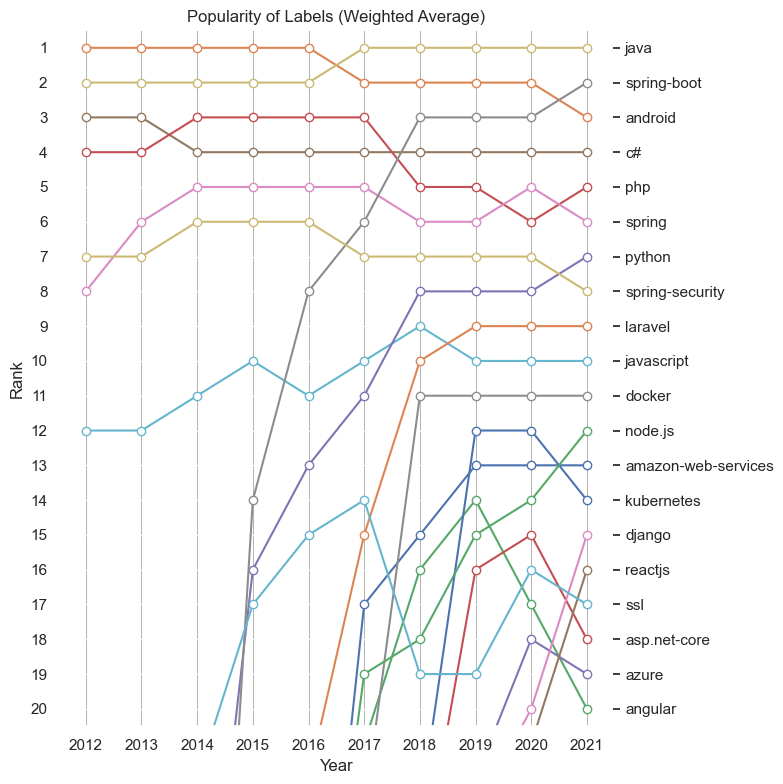

In [190]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))
#ranking_pd_modified = ranking_pd_modified[ranking_pd_modified['ranking'].between(1, 20)]

for i, j in ranking_pd_modified.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", ylabel="Rank", title="Popularity of Labels (Weighted Average)")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

filename = '/Users/gunardiali/Downloads/ranking_{}.png'.format(n_top_ranked)
plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
plt.tight_layout()

plt.show()

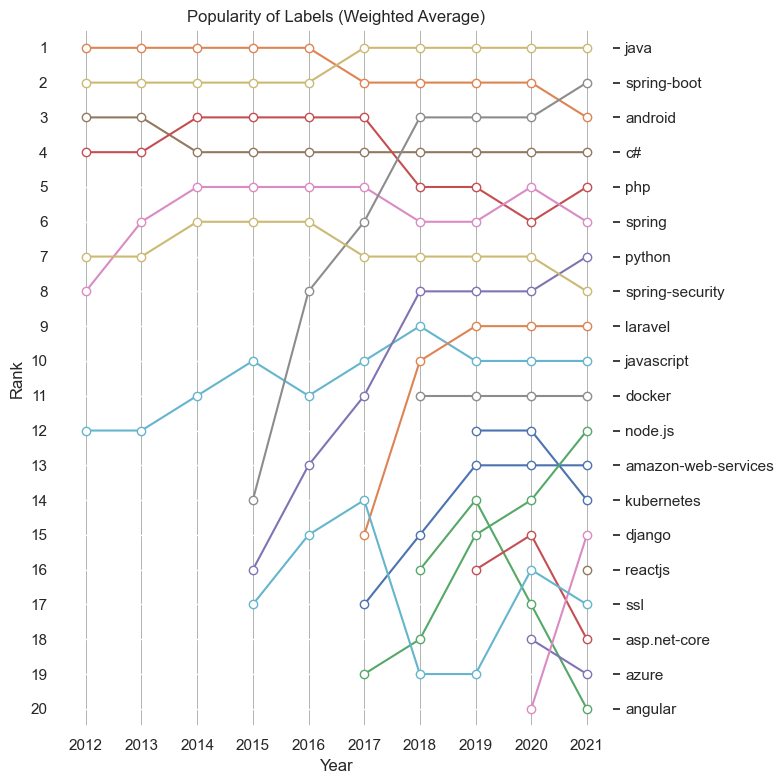

In [191]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))
ranking_pd_modified2 = ranking_pd_modified[ranking_pd_modified['ranking'].between(1, 20)]

for i, j in ranking_pd_modified2.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", ylabel="Rank", title="Popularity of Labels (Weighted Average)")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

filename = '/Users/gunardiali/Downloads/ranking_{}.png'.format(n_top_ranked)
plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
plt.tight_layout()

plt.show()

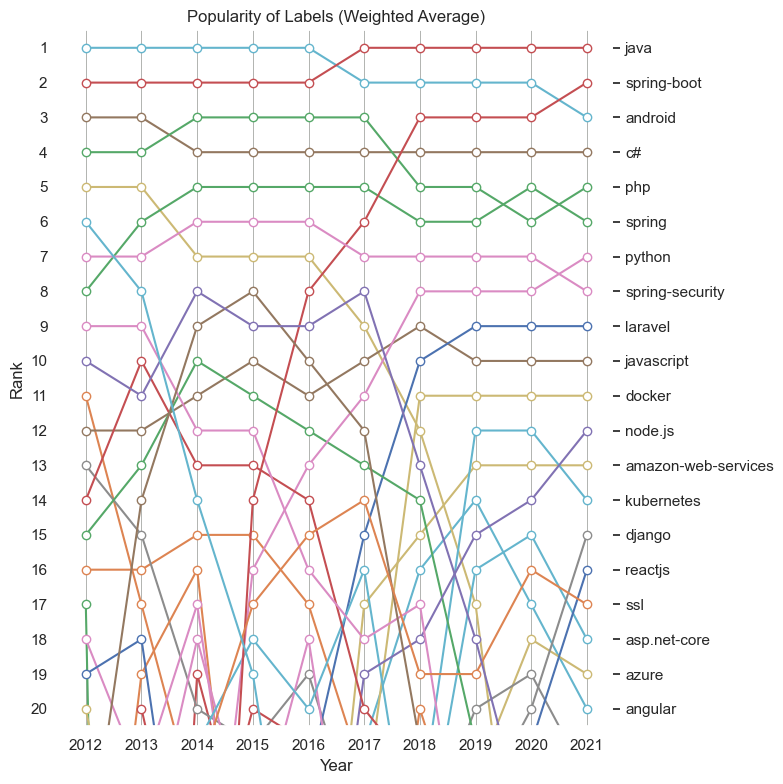

In [169]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))

for i, j in ranking_pd.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", ylabel="Rank", title="Popularity of Labels (Weighted Average)")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

#filename = '/Users/gunardiali/Downloads/ranking_{}_weighted_average.png'.format(n_top_ranked)
#plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
plt.tight_layout()

#plt.show()

[]

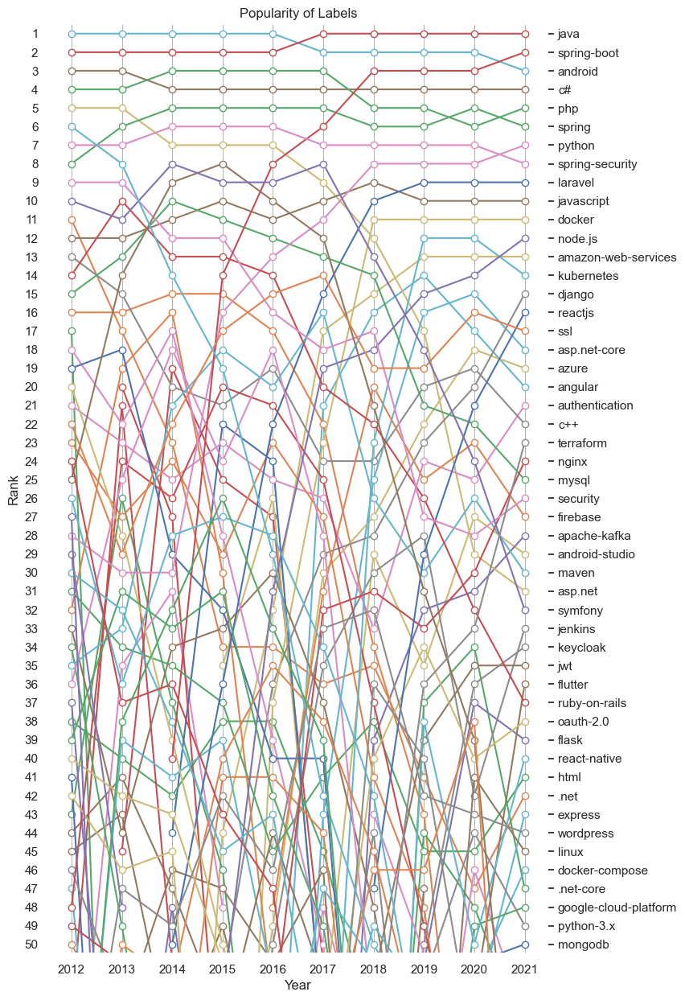

In [170]:
n_top_ranked = 50
top_labels = ranking_pd[ranking_pd["year"] == ranking_pd["year"].max()].nsmallest(n_top_ranked, "ranking")

fig, ax = plt.subplots(figsize=(8, 15), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))

for i, j in ranking_pd.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", ylabel="Rank", title="Popularity of Labels")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

#filename = '/Users/gunardiali/Downloads/ranking_{}.png'.format(n_top_ranked)
#plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
plt.plot()

[]

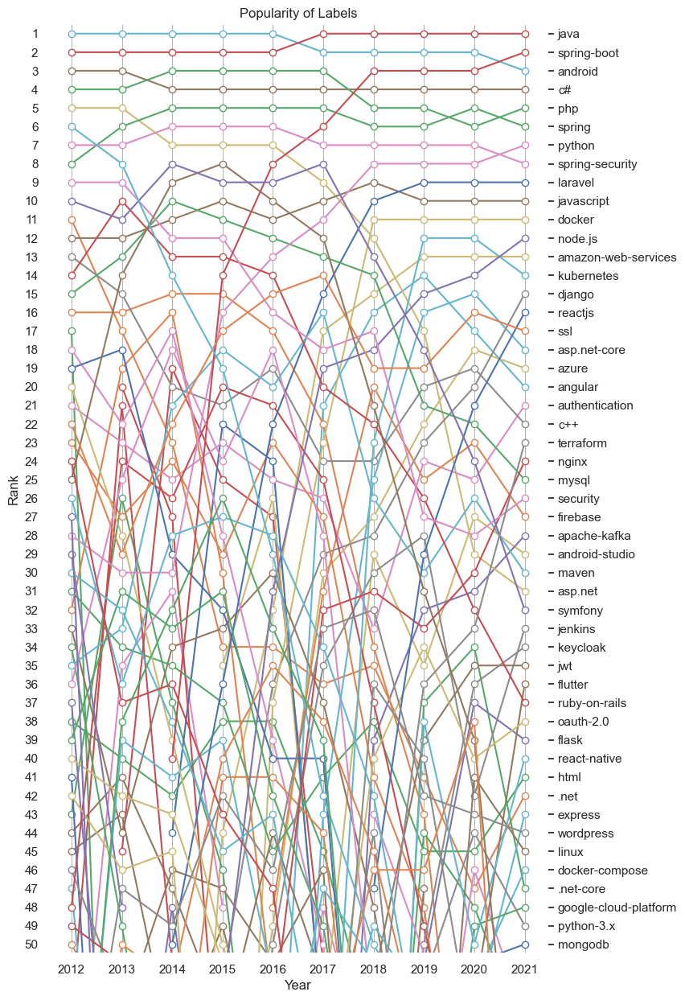

In [171]:
n_top_ranked = 50
top_labels = ranking_pd[ranking_pd["year"] == ranking_pd["year"].max()].nsmallest(n_top_ranked, "ranking")

fig, ax = plt.subplots(figsize=(8, 15), subplot_kw=dict(ylim=(0.5, 0.5 + n_top_ranked)))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(top_labels["ranking"].to_list()))
yax2.yaxis.set_major_formatter(FixedFormatter(top_labels["label"].to_list()))

for i, j in ranking_pd.groupby("label"):
    sorted_j = j.sort_values(by="year")
    ax.plot("year", "ranking", "o-", data=sorted_j, mfc="w")

ax.invert_yaxis()
ax.set(xlabel="Year", ylabel="Rank", title="Popularity of Labels")
ax.grid(axis="x", color='xkcd:grey', linestyle='-', linewidth=0.5)

ax.set_facecolor('xkcd:white')

#filename = '/Users/gunardiali/Downloads/ranking_{}_weighted_average.png'.format(n_top_ranked)
#plt.savefig(filename, format='png', dpi=1200, bbox_inches="tight")
plt.plot()